In [2]:
import numpy as np
import soundfile as sf
from beamformer import delaysum as ds
from beamformer import util
import glob
import os
from pathlib import Path
from IPython.display import Audio
import torch
import matplotlib.pyplot as plt


SAMPLING_FREQUENCY = 16000
FFT_LENGTH = 512
FFT_SHIFT = 256
# ENHANCED_WAV_NAME = './output/enhanced_speech_delaysum.wav'
MIC_ANGLE_VECTOR = np.arange(8, dtype="float32") * (360 / 8)+0
print(MIC_ANGLE_VECTOR)
LOOK_DIRECTION = 135
MIC_DIAMETER = 0.15

[  0.  45.  90. 135. 180. 225. 270. 315.]


In [37]:
print(list(range(337,360)))
print(list(range(337,360)) + list(range(22)))

[337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359]
[337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]


In [3]:
file_path = "save/a_c_stVec_d1_no0f.npy"
d_a_matrix, d_c_vector_list, steering_vector = np.load(file_path, allow_pickle=True)

# azimuth_list = list(range(337, 360)) + list(range(22))
azimuth_list = range(5, 15)
elevation_list = range(10, 60)
number_of_mic = 8
frequency_vector = np.linspace(0, int(16000 / 2), int(FFT_LENGTH / 2 + 1))
frequency_vector = frequency_vector[1:]
elevation_range = np.linspace(-89.5, 89.5, 180)

d_c_vector = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)
for azimuth in range(0, 360):
    for e, elevation in enumerate(elevation_range):
        for f, frequency in enumerate(frequency_vector):
            if (
                azimuth in azimuth_list
                and elevation >= min(elevation_list)
                and elevation < max(elevation_list)
            ):
                d_c_vector[f] += d_c_vector_list[azimuth][e][f]

filter = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)
response = np.ones(
    (len(range(0, 360)), len(elevation_range), len(frequency_vector), 1),
    dtype=np.complex64,
)

for f, frequency in enumerate(frequency_vector):
    epsilon = 1e-3 * np.linalg.norm(d_a_matrix[f])
    epsilon_I = epsilon * np.eye(d_a_matrix[f].shape[0])
    # epsilon_I=0
    w = np.dot(np.linalg.inv(d_a_matrix[f] + epsilon_I), d_c_vector[f])
    # print(w.shape)  # (8,)
    filter[f] = w
    # print(np.dot(np.conjugate(w).T, steering_vector[:, :, f]).shape)
    response[:, :, f] = np.dot(np.conjugate(w).T, steering_vector[:, :, f])

In [13]:
print(steering_vector.shape)
print(response.shape)

(360, 180, 256, 8, 1)
(360, 180, 256, 1)


In [68]:
print(filter.dtype)
print(response.dtype)

complex64
complex64


In [24]:
response_ = np.concatenate((np.zeros((8, 1), dtype=np.complex64), filter.T), axis=1)
print(response_.shape)

(8, 257)


In [5]:
meeting_folder = "/Users/ccui/Desktop/AMI_sample/amicorpus/ES2009a"
wavs = glob.glob(os.path.join(meeting_folder, "audio/*"))
array1_list = []
array1_list_torch = []
# wav_multi = np.zeros((len(wav), len(channel_index_vector)), dtype=np.float32)
for wav in wavs:
    mic_type = Path(wav).stem.split(".")[-1].split("-")[0]
    if mic_type in ["Array1"]:
        # array_path_list.append(str(Path(wav)))
        array, fs = sf.read(
            str(Path(wav)),
            dtype="float32",
        )
        # print(array.shape)
        array = array[16000 * 9 : 16000 * 15]
        array1_list_torch.append(torch.from_numpy(array).unsqueeze(0))
        array = array[..., np.newaxis]
        array1_list.append(array)
array1_list = np.concatenate(array1_list, axis=1)
print(array1_list.shape)
array1_list_torch = torch.cat(array1_list_torch, 0).float()

(96000, 8)


In [25]:
def get_enhenced(multi_channels_data, response_):
    # multi_channels_data = 

    complex_spectrum, _ = util.get_3dim_spectrum_from_data(
        multi_channels_data, FFT_LENGTH, FFT_SHIFT, FFT_LENGTH
    )
    # print(complex_spectrum.shape)
    ds_beamformer = ds.delaysum(
        MIC_ANGLE_VECTOR,
        MIC_DIAMETER,
        sampling_frequency=SAMPLING_FREQUENCY,
        fft_length=FFT_LENGTH,
        fft_shift=FFT_SHIFT,
    )
    # print(complex_spectrum.shape)
    beamformer = response_
    # print(beamformer.shape)

    enhanced_speech = ds_beamformer.apply_beamformer(beamformer, complex_spectrum)
    return enhanced_speech


enhanced_speech = get_enhenced(array1_list,response_)

In [13]:
Audio(data=array1_list_torch, rate=16000)

In [26]:
print(enhanced_speech.shape)
Audio(data=enhanced_speech, rate=16000)

(95744,)


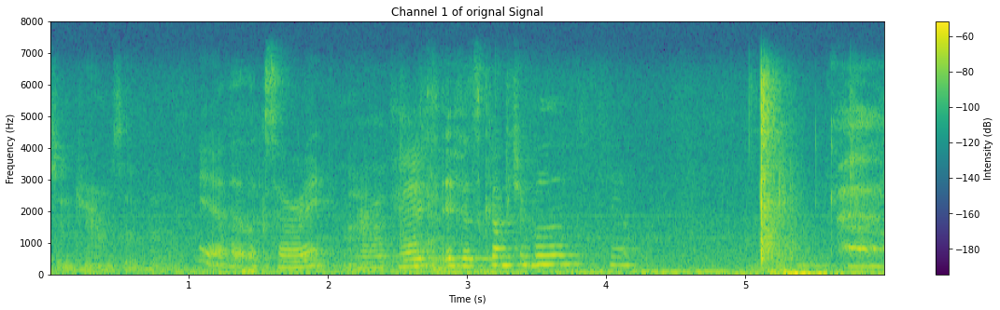

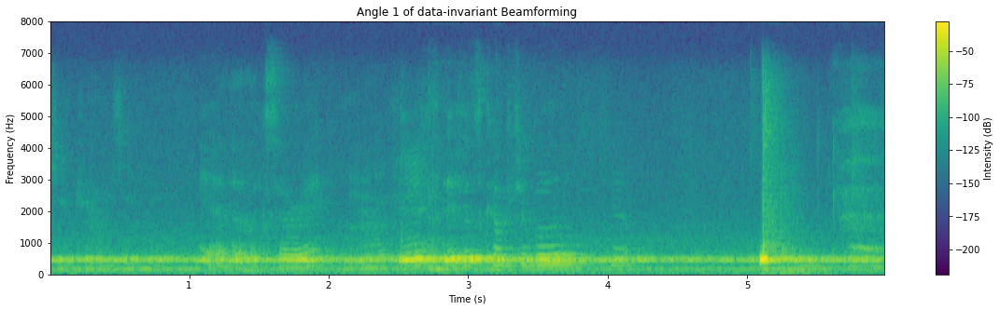

In [15]:
def get_spect(signal, title, vmin=-200, vmax=-60):
    plt.figure(figsize=(20, 5))
    # Compute the spectrogram
    Sxx, frequencies, _, _ = plt.specgram(signal, Fs=16000)
    # mask=frequencies>0
    # Sxx_masked = Sxx[mask, :]
    # sxx=10 * np.log10(Sxx)
    # # norm = Normalize(vmin=-150, vmax=-60)
    # # plt.imshow(sxx, aspect='auto', cmap='inferno', vmin=-150, vmax=-60)
    # plt.imshow(sxx, aspect='auto', cmap='inferno', vmin=vmin, vmax=vmax)
    # plt.gca().invert_yaxis()
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.title(title)
    plt.colorbar(label="Intensity (dB)")
    plt.show()


get_spect(array1_list_torch[0], "Channel 1 of orignal Signal")
# get_spect(beamformed_array1,"GCC-Phat Beamforming")
get_spect(enhanced_speech, "Angle 1 of data-invariant Beamforming")

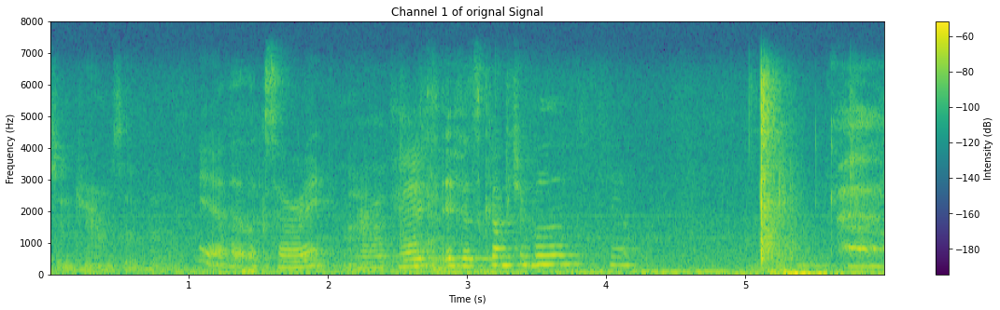

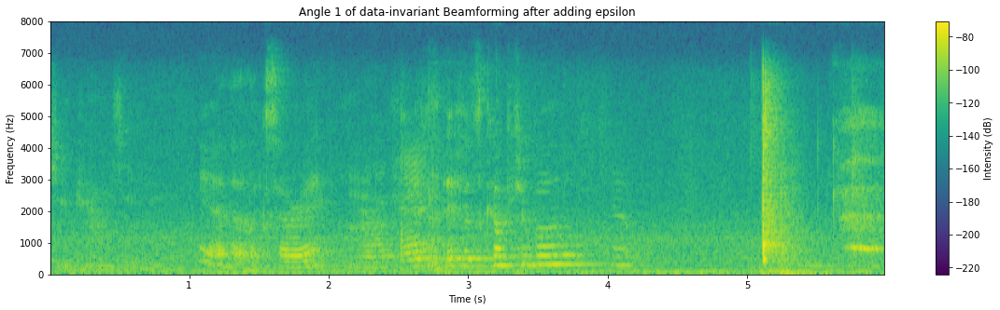

In [27]:
def get_spect(signal, title, vmin=-200, vmax=-60):
    plt.figure(figsize=(20, 5))
    # Compute the spectrogram
    Sxx, frequencies, _, _ = plt.specgram(signal, Fs=16000)
    # mask=frequencies>0
    # Sxx_masked = Sxx[mask, :]
    # sxx=10 * np.log10(Sxx)
    # # norm = Normalize(vmin=-150, vmax=-60)
    # # plt.imshow(sxx, aspect='auto', cmap='inferno', vmin=-150, vmax=-60)
    # plt.imshow(sxx, aspect='auto', cmap='inferno', vmin=vmin, vmax=vmax)
    # plt.gca().invert_yaxis()
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.title(title)
    plt.colorbar(label="Intensity (dB)")
    plt.show()


get_spect(array1_list_torch[0], "Channel 1 of orignal Signal")
# get_spect(beamformed_array1,"GCC-Phat Beamforming")
get_spect(enhanced_speech, "Angle 1 of data-invariant Beamforming after adding epsilon")

In [16]:
file_path = "save/a_c_stVec_d1_no0f_.npy"
d_a_matrix, d_c_vector_list, steering_vector = np.load(file_path, allow_pickle=True)

azimuth_list = range(0, 45)

num_ranges = 8

# Width of each range
range_width = int(360 / 8)

# Create eight ranges from 0 to 360 degrees
ranges = [(i * range_width, (i + 1) * range_width) for i in range(num_ranges)]

multi_angle = np.zeros((len(ranges), array1_list.shape[0]), dtype=np.float64)
elevation_list = range(30, 45)
for angle, azimuth_list in enumerate(ranges):
    number_of_mic = 8
    frequency_vector = np.linspace(0, int(16000 / 2), int(FFT_LENGTH / 2 + 1))
    frequency_vector = frequency_vector[1:]

    d_c_vector = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)
    for azimuth in range(0, 360):
        for elevation in range(-90, 90):
            for f, frequency in enumerate(frequency_vector):
                if azimuth in azimuth_list and elevation in elevation_list:
                    d_c_vector[f] += d_c_vector_list[azimuth][elevation][f]
    filter = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)
    response = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)

    for f, frequency in enumerate(frequency_vector):
        epsilon = 1e-3 * np.linalg.norm(d_a_matrix[f])
        epsilon_I = epsilon * np.eye(d_a_matrix[f].shape[0])
        w = np.dot(np.linalg.inv(d_a_matrix[f] + epsilon_I), d_c_vector[f])
        # print(w.shape)  # (8,)
        filter[f] = w
        # response[f] = np.dot(np.conjugate(w).T, steering_vector[f])
    # response_ = np.concatenate((np.zeros((8, 1), dtype=np.complex64), response.T), axis=1)
    response_ = np.concatenate((np.zeros((8, 1), dtype=np.complex64), filter.T), axis=1)
    enhanced_speech = get_enhenced(array1_list, response_)
    multi_angle[angle][: len(enhanced_speech)] = enhanced_speech

(8, 373, 257)
(8, 373, 257)
(8, 373, 257)
(8, 373, 257)
(8, 373, 257)
(8, 373, 257)
(8, 373, 257)
(8, 373, 257)


In [93]:
Audio(data=multi_angle[0], rate=16000)

/opt/anaconda3/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


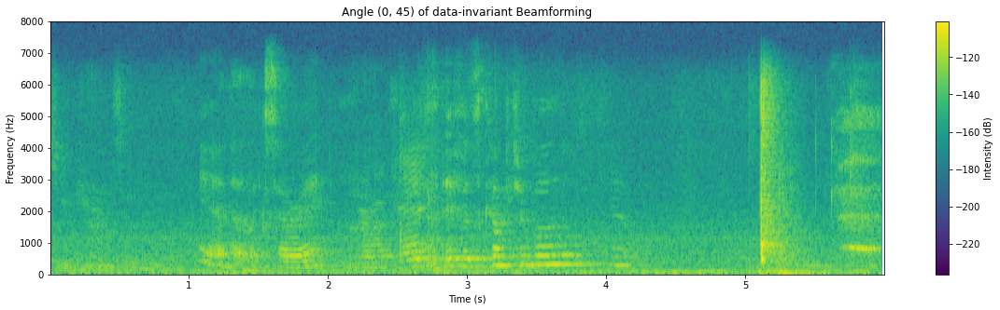

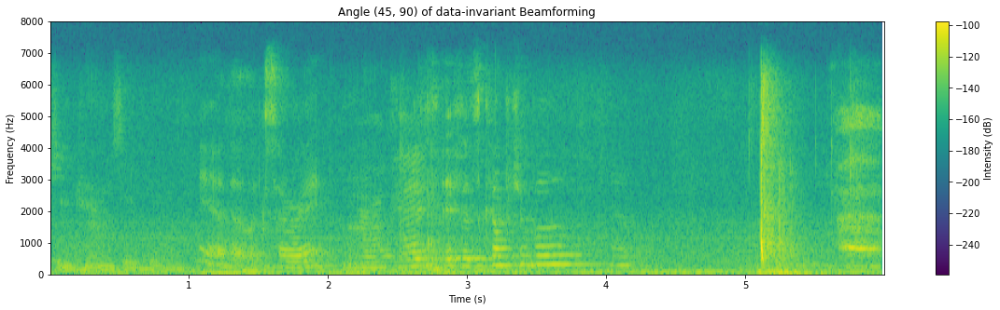

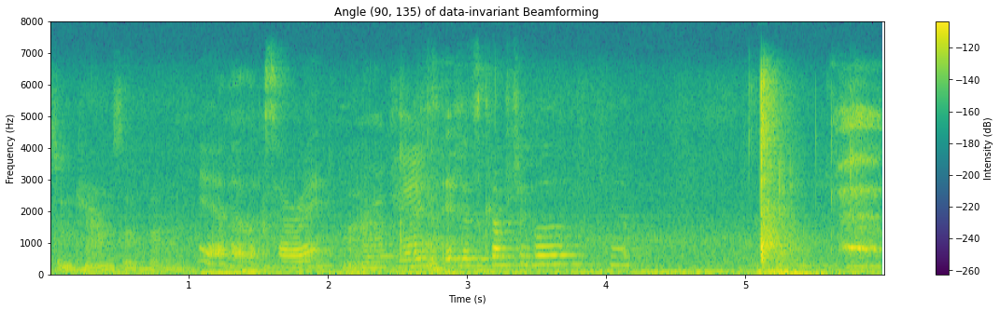

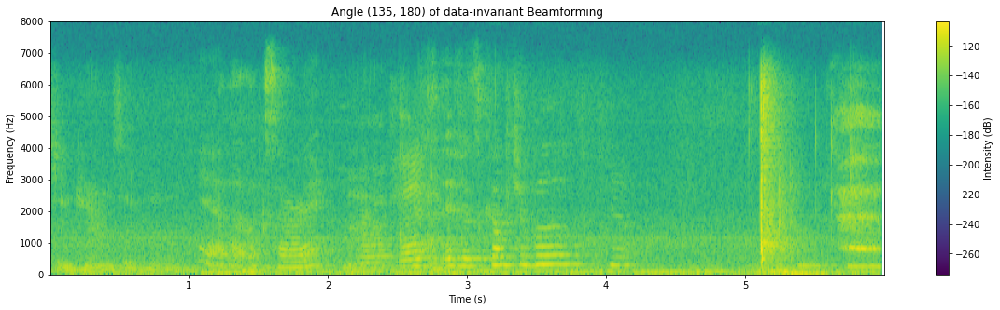

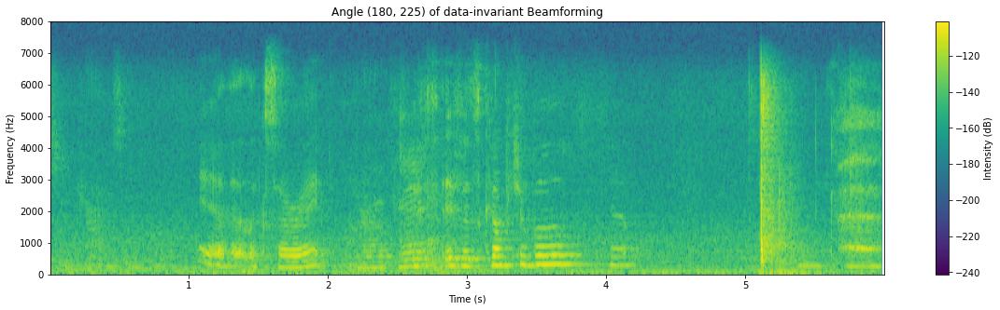

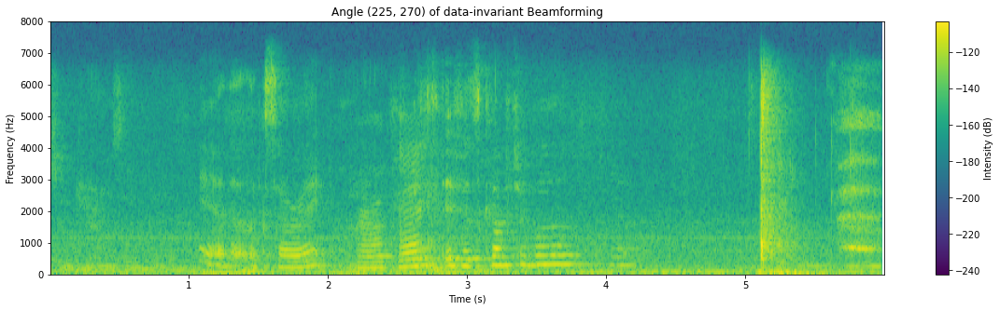

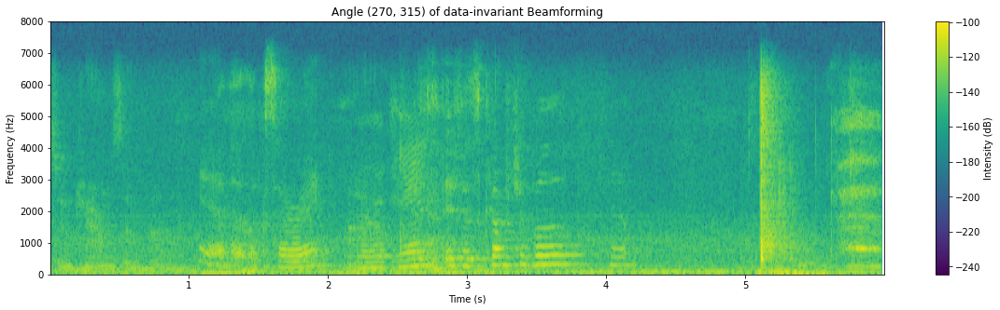

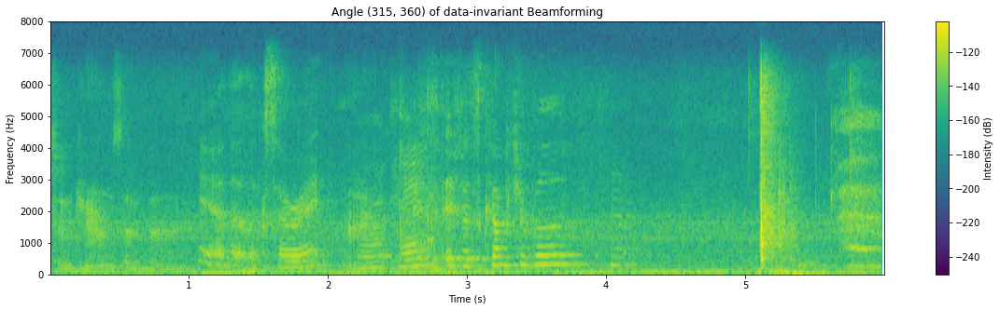

In [17]:
for angle, azimuth_list in enumerate(ranges):
    get_spect(multi_angle[angle], "Angle %s of data-invariant Beamforming" % str(azimuth_list))

In [8]:
num_ranges = 8

# Width of each range
range_width = int(360 / 8)

# Create eight ranges from 0 to 360 degrees
ranges = [(i * range_width, (i + 1) * range_width) for i in range(num_ranges)]

elevation_list = range(30, 45)


def get_response(ranges, elevation_list):
    number_of_mic = 8
    frequency_vector = np.linspace(0, int(16000 / 2), int(FFT_LENGTH / 2 + 1))
    frequency_vector = frequency_vector[1:]
    response_all = np.ones(
        (len(ranges), number_of_mic, len(frequency_vector) + 1),
        dtype=np.complex64,
    )
    for angle, azimuth_list in enumerate(ranges):
        d_c_vector = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)
        for azimuth in range(0, 360):
            for elevation in range(-90, 90):
                for f, frequency in enumerate(frequency_vector):
                    if azimuth in azimuth_list and elevation in elevation_list:
                        d_c_vector[f] += d_c_vector_list[azimuth][elevation][f]
        filter = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)
        response = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)

        for f, frequency in enumerate(frequency_vector):
            epsilon = 1e-3 * np.linalg.norm(d_a_matrix[f])
            epsilon_I = epsilon * np.eye(d_a_matrix[f].shape[0])
            w = np.dot(np.linalg.inv(d_a_matrix[f] + epsilon_I), d_c_vector[f])
            # print(w.shape)  # (8,)
            filter[f] = w
            # response[f] = np.dot(np.conjugate(w).T, steering_vector[f])
        response_ = np.concatenate(
            (np.zeros((number_of_mic, 1), dtype=np.complex64), filter.T), axis=1
        )
        response_all[angle] = response_
    return response_all


response_all = get_response(ranges, elevation_list)
# np.save(os.path.join("save", "8angle_from0.npy"), response_all)

In [11]:
def get_response_azi_ele(azimuth_list, elevation_list):
    number_of_mic = 8
    frequency_vector = np.linspace(0, int(16000 / 2), int(FFT_LENGTH / 2 + 1))
    frequency_vector = frequency_vector[1:]
    # response_all = np.ones(
    #     (len(ranges), number_of_mic, len(frequency_vector) + 1),
    #     dtype=np.complex64,
    # )
    # for angle, azimuth_list in enumerate(ranges):
    d_c_vector = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)
    for azimuth in range(0, 360):
        for elevation in range(-90, 90):
            for f, frequency in enumerate(frequency_vector):
                if azimuth in azimuth_list and elevation in elevation_list:
                    d_c_vector[f] += d_c_vector_list[azimuth][elevation][f]
    filter = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)
    response = np.ones((len(frequency_vector), number_of_mic), dtype=np.complex64)

    for f, frequency in enumerate(frequency_vector):
        epsilon = 1e-3 * np.linalg.norm(d_a_matrix[f])
        epsilon_I = epsilon * np.eye(d_a_matrix[f].shape[0])
        w = np.dot(np.linalg.inv(d_a_matrix[f] + epsilon_I), d_c_vector[f])
        # print(w.shape)  # (8,)
        filter[f] = w
        response[f] = np.dot(np.conjugate(w).T, steering_vector[f])
    response_ = np.concatenate(
        (np.zeros((number_of_mic, 1), dtype=np.complex64), response.T), axis=1
    )
    return response_

In [95]:
num_ranges = 180
# Width of each range
range_width = int(360 / num_ranges)
azi_ranges_180 = [(i * range_width, (i + 1) * range_width) for i in range(num_ranges)]
# response_180 = get_response(ranges_180)
print(azi_ranges_180)
# 
n = 90
ele_width = (90 - (-90)) / n  # Corrected formula
ele_ranges = [
    ((-90) + i * ele_width, (-90) + (i + 1) * ele_width) for i in range(n)
]  # Adjusted order

print(ele_ranges)

[(0, 2), (2, 4), (4, 6), (6, 8), (8, 10), (10, 12), (12, 14), (14, 16), (16, 18), (18, 20), (20, 22), (22, 24), (24, 26), (26, 28), (28, 30), (30, 32), (32, 34), (34, 36), (36, 38), (38, 40), (40, 42), (42, 44), (44, 46), (46, 48), (48, 50), (50, 52), (52, 54), (54, 56), (56, 58), (58, 60), (60, 62), (62, 64), (64, 66), (66, 68), (68, 70), (70, 72), (72, 74), (74, 76), (76, 78), (78, 80), (80, 82), (82, 84), (84, 86), (86, 88), (88, 90), (90, 92), (92, 94), (94, 96), (96, 98), (98, 100), (100, 102), (102, 104), (104, 106), (106, 108), (108, 110), (110, 112), (112, 114), (114, 116), (116, 118), (118, 120), (120, 122), (122, 124), (124, 126), (126, 128), (128, 130), (130, 132), (132, 134), (134, 136), (136, 138), (138, 140), (140, 142), (142, 144), (144, 146), (146, 148), (148, 150), (150, 152), (152, 154), (154, 156), (156, 158), (158, 160), (160, 162), (162, 164), (164, 166), (166, 168), (168, 170), (170, 172), (172, 174), (174, 176), (176, 178), (178, 180), (180, 182), (182, 184), (18

In [96]:
azimuth_values = []
elevation_values = []
steering_vector_values = []

# Nested loop to iterate over azimuth and elevation values
for azimuth in azi_ranges_180:
    for elevation in ele_ranges:
        # Calculate the steering vector for the current azimuth and elevation
        # if azimuth in azi_ranges_180:
        # response = get_response_azi_ele(azimuth, elevation)
        # chn1_steering_vector = np.real(response[0, :])
        # Append the values to the respective lists
        azimuth_values.append(azimuth[0])
        elevation_values.append(elevation[0])
        # steering_vector_values.append(chn1_steering_vector.tolist())
# Convert lists to NumPy arrays
# azimuth_values = np.array(azimuth_values)
# elevation_values = np.array(elevation_values)
# steering_vector_values = np.array(steering_vector_values)
print(azimuth_values)
print(elevation_values)
# np.save(os.path.join("save", "d2_response_vector_values.npy"), steering_vector_values)
steering_vector_values = np.load("save/d2_response_vector_values.npy", allow_pickle=True)

In [68]:
print(len(steering_vector_values))
for s in steering_vector_values:
    print(len(s))
    break

16200
257


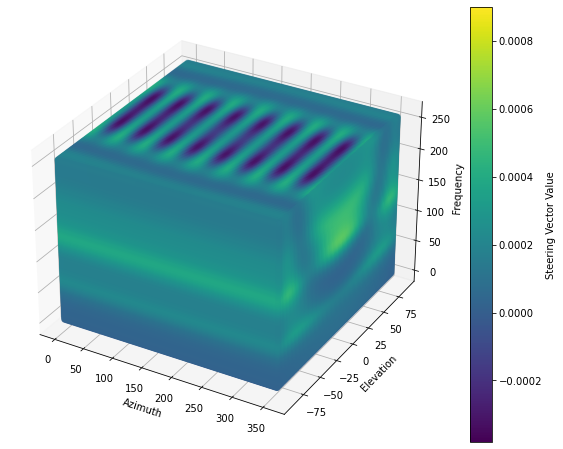

In [69]:
# Create a 3D plot
fig = plt.figure(figsize=(10, 8))  # Adjust the figsize as needed
ax = fig.add_subplot(111, projection="3d")

# Create a list of frequencies, e.g., freq_values
# You can adjust this list based on your actual data
freq_values = range(257)

# Repeat azimuth, elevation, and frequency for all data points
azimuth_values_3d = np.repeat(azimuth_values, len(freq_values))
elevation_values_3d = np.repeat(elevation_values, len(freq_values))
freq_values_3d = np.tile(freq_values, len(azimuth_values))

# Flatten the list of lists to a 1D array for colors
colors = [value for sublist in steering_vector_values for value in sublist]

# Create a 3D scatter plot with colors representing steering vector values
sc = ax.scatter(azimuth_values_3d, elevation_values_3d, freq_values_3d, c=colors, cmap="viridis")

# Set axis labels
ax.set_xlabel("Azimuth")
ax.set_ylabel("Elevation")
ax.set_zlabel("Frequency")

# Create a color bar for the color mapping
cbar = fig.colorbar(sc)
cbar.set_label("Steering Vector Value")

# Show the plot
plt.show()

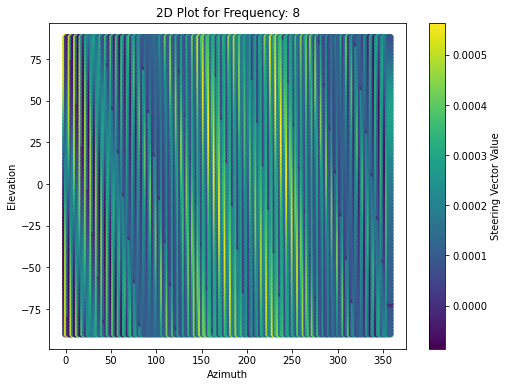

In [75]:
# Assume selected_frequency is the frequency you want to visualize
selected_frequency_index = 8  # Adjust this index based on your data

# Create a 2D plot for the selected frequency
fig, ax = plt.subplots(figsize=(8, 6))

# Filter the data for the selected frequency
selected_freq_values = freq_values[selected_frequency_index]

# Filter the colors for the selected frequency
selected_colors = colors[
    selected_frequency_index
    * len(azimuth_values) : (selected_frequency_index + 1)
    * len(azimuth_values)
]

# Create a scatter plot with colors representing steering vector values
sc = ax.scatter(azimuth_values, elevation_values, c=selected_colors, cmap="viridis")

# Set axis labels
ax.set_xlabel("Azimuth")
ax.set_ylabel("Elevation")

# Create a color bar for the color mapping
cbar = fig.colorbar(sc)
cbar.set_label("Steering Vector Value")

# Show the plot
plt.title(f"2D Plot for Frequency: {selected_freq_values}")
plt.show()

In [117]:

steering_vector_values = np.load("save/d2_response_vector_values.npy", allow_pickle=True)
# Reshape the flat list to a 3D array
num_azimuths = 180
num_elevations = 90
num_freqs = 257
# if num_azimuths * num_elevations == len(steering_vector_values):
reshaped_array = np.array(steering_vector_values).reshape((num_azimuths, num_elevations, num_freqs))

print(reshaped_array.shape)

(180, 90, 257)


/var/folders/l5/9kglh8tx5nb_wn200vv8zgwh00mc7h/T/ipykernel_97154/1094643457.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


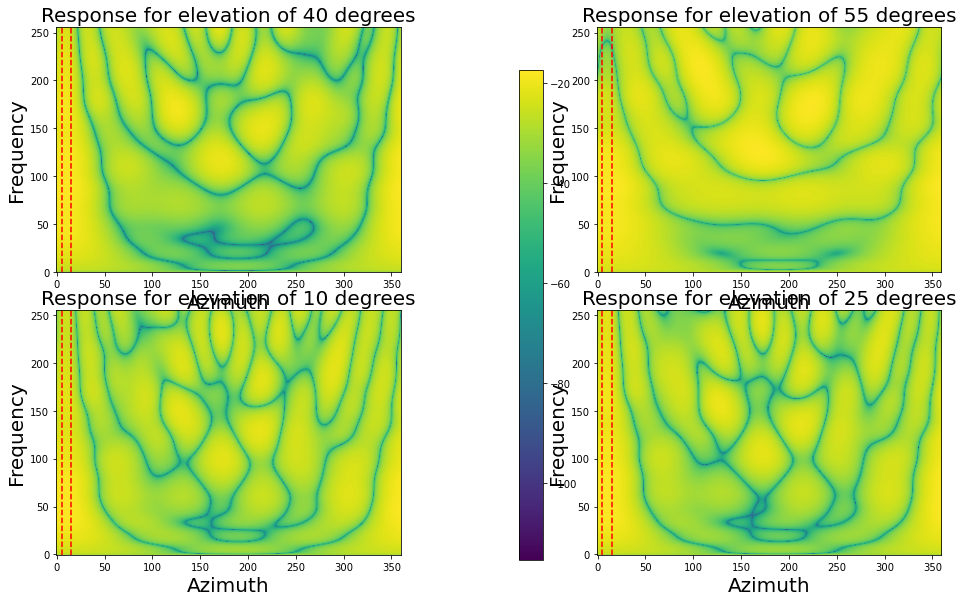

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and axis for subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 8))  # 2 rows, 2 columns
plt.subplots_adjust(left=0.08, right=0.69, top=0.9, bottom=0.05, hspace=0.3)

elevation = range(10, 60, 15)

for e in elevation:
    # Calculate the row and column indices for the subplot
    row_index = (e - 30) // 15 // 2  # Adjusted for the step size of 5
    col_index = (e - 30) // 15 % 2  # Adjusted for the step size of 5 and 2 columns

    # Create a 2D scatter plot in the specified subplot
    # Calculate the magnitude (absolute value) for each element in the matrix
    magnitudes = np.abs(response[:, e + 90, :, 0])

    # Calculate the decibel values for each element in the matrix
    decibels = 20 * np.log10(magnitudes + 1e-10)  # Adding a small value to avoid log(0)

    # Calculate the scaling factor based on vmin and 10**-4.5
    max_value = np.max(decibels)
    min_value = np.min(decibels)
    scaling_factor = (max_value - 90) / min_value

    # Scale the magnitudes
    scaled_decibels = decibels * scaling_factor

    im = axs[row_index, col_index].imshow(scaled_decibels.T, origin="lower")

    # Add vertical dashed lines at 377 and 22 degrees
    axs[row_index, col_index].axvline(
        x=5, linestyle="--", color="red", linewidth=1.5, label="Angle 377°"
    )
    axs[row_index, col_index].axvline(
        x=15, linestyle="--", color="red", linewidth=1.5, label="Angle 22°"
    )

    # Set axis labels
    axs[row_index, col_index].set_xlabel("Azimuth", fontsize=20)
    axs[row_index, col_index].set_ylabel("Frequency", fontsize=20)
    axs[row_index, col_index].set_title(
        "Response for elevation of %s degrees" % str(e), fontsize=20
    )
    # Create a color bar for the color mapping
cbar = fig.colorbar(im, ax=axs, location="right", pad=0.01)
# cbar.set_label("Response for elevation of %s degrees" % str(e), fontsize=20)

# Adjust layout to prevent clipping of labels
plt.tight_layout()
plt.savefig("save/Azi5_15_ele10_60.png")
# Show the plot
plt.show()

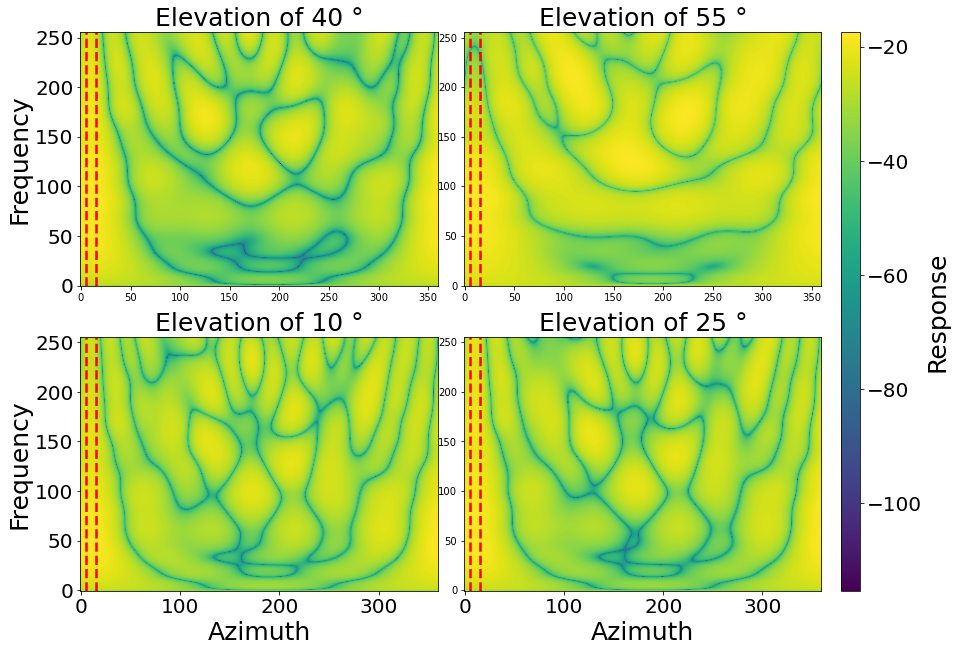

In [80]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec

# Create a figure and axis for subplots
fig = plt.figure(figsize=(12, 8))

# Use gridspec to create a grid with 2 rows and 3 columns
gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 0.05])

axs = np.empty((2, 2), dtype=object)

for i in range(2):
    for j in range(2):
        axs[i, j] = plt.subplot(gs[i, j])

elevation = range(10, 60, 15)

for e in elevation:
    # ... (your existing code remains unchanged)
    # Calculate the row and column indices for the subplot
    row_index = (e - 30) // 15 // 2  # Adjusted for the step size of 5
    col_index = (e - 30) // 15 % 2  # Adjusted for the step size of 5 and 2 columns

    # Create a 2D scatter plot in the specified subplot
    # Calculate the magnitude (absolute value) for each element in the matrix
    magnitudes = np.abs(response[:, e + 90, :, 0])

    # Calculate the decibel values for each element in the matrix
    decibels = 20 * np.log10(magnitudes + 1e-10)  # Adding a small value to avoid log(0)

    # Calculate the scaling factor based on vmin and 10**-4.5
    max_value = np.max(decibels)
    min_value = np.min(decibels)
    scaling_factor = (max_value - 90) / min_value

    # Scale the magnitudes
    scaled_decibels = decibels * scaling_factor
    im = axs[row_index, col_index].imshow(scaled_decibels.T, origin="lower")

    # Add vertical dashed lines at 377 and 22 degrees
    axs[row_index, col_index].axvline(
        x=5, linestyle="--", color="red", linewidth=2.5, label="Angle 377°"
    )
    axs[row_index, col_index].axvline(
        x=15, linestyle="--", color="red", linewidth=2.5, label="Angle 22°"
    )
    if e in [10,25]:
        # Set axis labels with larger font size
        axs[row_index, col_index].set_xlabel("Azimuth", fontsize=25)
    if e in [40,10]:
        axs[row_index, col_index].set_ylabel("Frequency", fontsize=25)

    # Set the title for each subplot
    axs[row_index, col_index].set_title("Elevation of %s °" % str(e), fontsize=25)
    if e in [10, 25]:
        axs[row_index, col_index].tick_params(axis="x", labelsize=20)
    if e in [10, 40]:
        axs[row_index, col_index].tick_params(axis="y", labelsize=20)

# Create a single color bar for all subplots to the right of the second column
cax = plt.subplot(gs[:, 2])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label("Response", fontsize=25)
cbar.ax.tick_params(labelsize=20)

# Adjust layout to prevent clipping of labels
# plt.tight_layout()
plt.subplots_adjust(left=0.08, top=0.99, bottom=0.02, hspace=0.2, right=0.99, wspace=0.05)
plt.savefig("save/Azi5_15_ele10_60.png", bbox_inches="tight")
# Show the plot
plt.show()

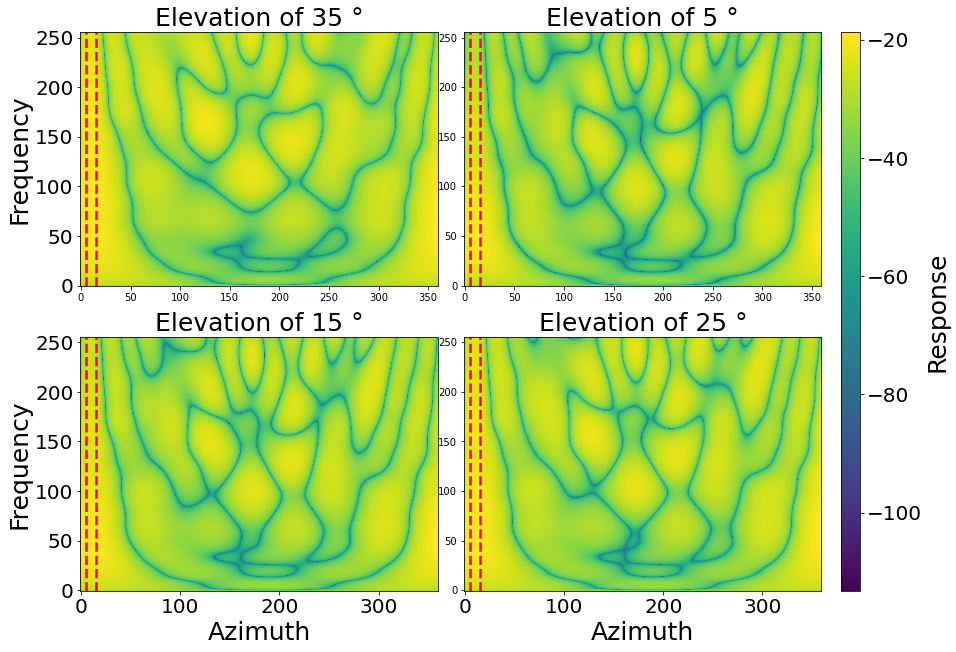

In [79]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec

# Create a figure and axis for subplots
fig = plt.figure(figsize=(12, 8))

# Use gridspec to create a grid with 2 rows and 3 columns
gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 0.05])

axs = np.empty((2, 2), dtype=object)

for i in range(2):
    for j in range(2):
        axs[i, j] = plt.subplot(gs[i, j])
hop = 10
elevation = range(5, 40, hop)


for e in elevation:
    # ... (your existing code remains unchanged)
    # Calculate the row and column indices for the subplot
    row_index = (e - 30) // hop // 2  # Adjusted for the step size of 5
    col_index = (e - 30) // hop % 2  # Adjusted for the step size of 5 and 2 columns

    # Create a 2D scatter plot in the specified subplot
    # Calculate the magnitude (absolute value) for each element in the matrix
    magnitudes = np.abs(response[:, e + 90, :, 0])

    # Calculate the decibel values for each element in the matrix
    decibels = 20 * np.log10(magnitudes + 1e-10)  # Adding a small value to avoid log(0)

    # Calculate the scaling factor based on vmin and 10**-4.5
    max_value = np.max(decibels)
    min_value = np.min(decibels)
    scaling_factor = (max_value - 90) / min_value

    # Scale the magnitudes
    scaled_decibels = decibels * scaling_factor
    im = axs[row_index, col_index].imshow(scaled_decibels.T, origin="lower")

    # Add vertical dashed lines at 377 and 22 degrees
    axs[row_index, col_index].axvline(
        x=5, linestyle="--", color="red", linewidth=2.5, label="Angle 377°"
    )
    axs[row_index, col_index].axvline(
        x=15, linestyle="--", color="red", linewidth=2.5, label="Angle 22°"
    )
    if e in [15, 25]:
        # Set axis labels with larger font size
        axs[row_index, col_index].set_xlabel("Azimuth", fontsize=25)
    if e in [15, 35]:
        axs[row_index, col_index].set_ylabel("Frequency", fontsize=25)

    # Set the title for each subplot
    axs[row_index, col_index].set_title("Elevation of %s °" % str(e), fontsize=25)
    if e in [15, 25]:
        axs[row_index, col_index].tick_params(axis="x", labelsize=20)
    if e in [35, 15]:
        axs[row_index, col_index].tick_params(axis="y", labelsize=20)

# Create a single color bar for all subplots to the right of the second column
cax = plt.subplot(gs[:, 2])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label("Response", fontsize=25)
cbar.ax.tick_params(labelsize=20)

# Adjust layout to prevent clipping of labels
# plt.tight_layout()
plt.subplots_adjust(left=0.08, top=0.99, bottom=0.02, hspace=0.2, right=0.99, wspace=0.05)
plt.savefig("save/Azi5_15_ele5_40.png", bbox_inches="tight")
# Show the plot
plt.show()

In [50]:
elevation = range(15, 55, 5)
print(np.linspace(-89.5, 89.5, 180))
print(len(np.linspace(-89.5, 89.5, 180)))

[-89.5 -88.5 -87.5 -86.5 -85.5 -84.5 -83.5 -82.5 -81.5 -80.5 -79.5 -78.5
 -77.5 -76.5 -75.5 -74.5 -73.5 -72.5 -71.5 -70.5 -69.5 -68.5 -67.5 -66.5
 -65.5 -64.5 -63.5 -62.5 -61.5 -60.5 -59.5 -58.5 -57.5 -56.5 -55.5 -54.5
 -53.5 -52.5 -51.5 -50.5 -49.5 -48.5 -47.5 -46.5 -45.5 -44.5 -43.5 -42.5
 -41.5 -40.5 -39.5 -38.5 -37.5 -36.5 -35.5 -34.5 -33.5 -32.5 -31.5 -30.5
 -29.5 -28.5 -27.5 -26.5 -25.5 -24.5 -23.5 -22.5 -21.5 -20.5 -19.5 -18.5
 -17.5 -16.5 -15.5 -14.5 -13.5 -12.5 -11.5 -10.5  -9.5  -8.5  -7.5  -6.5
  -5.5  -4.5  -3.5  -2.5  -1.5  -0.5   0.5   1.5   2.5   3.5   4.5   5.5
   6.5   7.5   8.5   9.5  10.5  11.5  12.5  13.5  14.5  15.5  16.5  17.5
  18.5  19.5  20.5  21.5  22.5  23.5  24.5  25.5  26.5  27.5  28.5  29.5
  30.5  31.5  32.5  33.5  34.5  35.5  36.5  37.5  38.5  39.5  40.5  41.5
  42.5  43.5  44.5  45.5  46.5  47.5  48.5  49.5  50.5  51.5  52.5  53.5
  54.5  55.5  56.5  57.5  58.5  59.5  60.5  61.5  62.5  63.5  64.5  65.5
  66.5  67.5  68.5  69.5  70.5  71.5  72.5  73.5  7

In [102]:
MIC_ANGLE_VECTOR = np.arange(4, dtype="float32") * (360 / 4) + 0
print(MIC_ANGLE_VECTOR)

[  0.  90. 180. 270.]
